In [1]:
import pickle
import os
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

# 设置中文字体（如果需要）
plt.rcParams['font.sans-serif'] = ['DejaVu Sans']
plt.rcParams['axes.unicode_minus'] = False


In [2]:
# 数据目录
data_dir = 'AllSubjects_Epochs/train'

# 按类别组织文件
files_by_label = defaultdict(list)

print("正在加载文件信息...")
for f in os.listdir(data_dir):
    if f.endswith('.pickle'):
        file_path = os.path.join(data_dir, f)
        try:
            data = pickle.load(open(file_path, 'rb'))
            label = data['label']
            files_by_label[label].append(f)
        except Exception as e:
            print(f"加载文件 {f} 时出错: {e}")

# 打印每个类别的文件数量
print("\n每个类别的文件数量:")
for label in sorted(files_by_label.keys()):
    print(f"类别 {label}: {len(files_by_label[label])} 个文件")


正在加载文件信息...

每个类别的文件数量:
类别 1: 5816 个文件
类别 2: 5872 个文件
类别 3: 5425 个文件
类别 4: 5449 个文件
类别 5: 5429 个文件
类别 6: 5709 个文件


In [3]:
def visualize_class_raw_data(label, num_files=20, data_dir='AllSubjects_Epochs/train'):
    """
    可视化指定类别的原始pickle数据
    
    参数:
    label: 类别标签 (1-6)
    num_files: 要可视化的文件数量（默认20个）
    data_dir: 数据目录
    """
    if label not in files_by_label:
        print(f"类别 {label} 没有找到文件")
        return
    
    # 选择前num_files个文件
    selected_files = files_by_label[label][:num_files]
    
    if len(selected_files) < num_files:
        print(f"警告: 类别 {label} 只有 {len(selected_files)} 个文件，少于请求的 {num_files} 个")
    
    # 创建图形，20列（每个文件一列）
    fig, axes = plt.subplots(20, num_files, figsize=(num_files * 2, 20))
    
    # 如果只有一个文件，axes需要特殊处理
    if num_files == 1:
        axes = axes.reshape(-1, 1)
    
    # 加载并绘制每个文件的数据
    for col_idx, filename in enumerate(selected_files):
        file_path = os.path.join(data_dir, filename)
        try:
            # 加载pickle文件
            data = pickle.load(open(file_path, 'rb'))
            signal = data['signal']  # shape: (20, 200)
            
            # 确保是20通道
            if signal.shape[0] != 20:
                print(f"警告: 文件 {filename} 的通道数不是20，而是 {signal.shape[0]}")
            
            # 绘制每个通道
            for channel_idx in range(20):
                ax = axes[channel_idx, col_idx]
                
                # 绘制原始数据（不做任何处理）
                if channel_idx < signal.shape[0]:
                    ax.plot(signal[channel_idx, :], linewidth=0.5)
                
                # 设置标题和标签
                if channel_idx == 0:
                    ax.set_title(f'File {col_idx+1}\n{filename[:30]}...', fontsize=6, pad=2)
                if col_idx == 0:
                    ax.set_ylabel(f'Ch{channel_idx+1}', fontsize=6, rotation=0, ha='right')
                
                # 移除刻度标签以节省空间
                ax.set_xticks([])
                ax.set_yticks([])
                ax.spines['top'].set_visible(False)
                ax.spines['right'].set_visible(False)
                ax.spines['bottom'].set_visible(False)
                ax.spines['left'].set_visible(False)
                
        except Exception as e:
            print(f"加载文件 {filename} 时出错: {e}")
            # 如果出错，显示空白
            for channel_idx in range(20):
                ax = axes[channel_idx, col_idx]
                ax.text(0.5, 0.5, 'Error', ha='center', va='center', fontsize=8)
                ax.set_xticks([])
                ax.set_yticks([])
    
    plt.suptitle(f'类别 {label} 的原始数据可视化 (20通道 × {num_files}个文件)', 
                 fontsize=14, y=0.995)
    plt.tight_layout(rect=[0, 0, 1, 0.99])
    plt.show()
    
    print(f"\n类别 {label} 可视化完成，显示了 {len(selected_files)} 个文件")


警告: 文件 Sub04_Walkfast_epoch002.pickle 的通道数不是20，而是 30


/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 31867 (\N{CJK UNIFIED IDEOGRAPH-7C7B}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 21035 (\N{CJK UNIFIED IDEOGRAPH-522B}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 30340 (\N{CJK UNIFIED IDEOGRAPH-7684}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 21407 (\N{CJK UNIFIED IDEOGRAPH-539F}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 22987 (\N{CJK UNIFIED IDEOGRAPH-59CB}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 25968 (\N{CJK UNIFIED IDEOGRAPH-6570}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4

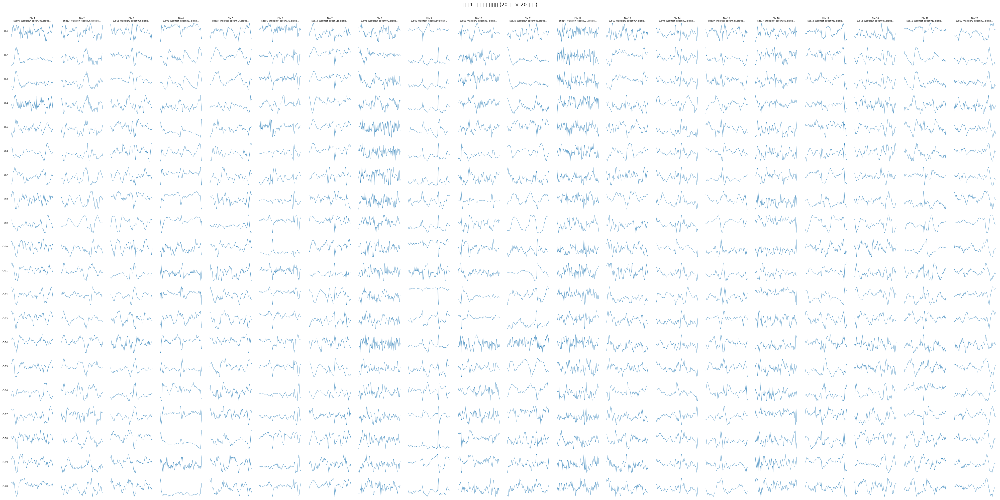


类别 1 可视化完成，显示了 20 个文件


In [4]:
# 可视化类别 1 的20个pickle文件原始数据
visualize_class_raw_data(label=1, num_files=20)


/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 31867 (\N{CJK UNIFIED IDEOGRAPH-7C7B}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 21035 (\N{CJK UNIFIED IDEOGRAPH-522B}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 30340 (\N{CJK UNIFIED IDEOGRAPH-7684}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 21407 (\N{CJK UNIFIED IDEOGRAPH-539F}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 22987 (\N{CJK UNIFIED IDEOGRAPH-59CB}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 25968 (\N{CJK UNIFIED IDEOGRAPH-6570}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4

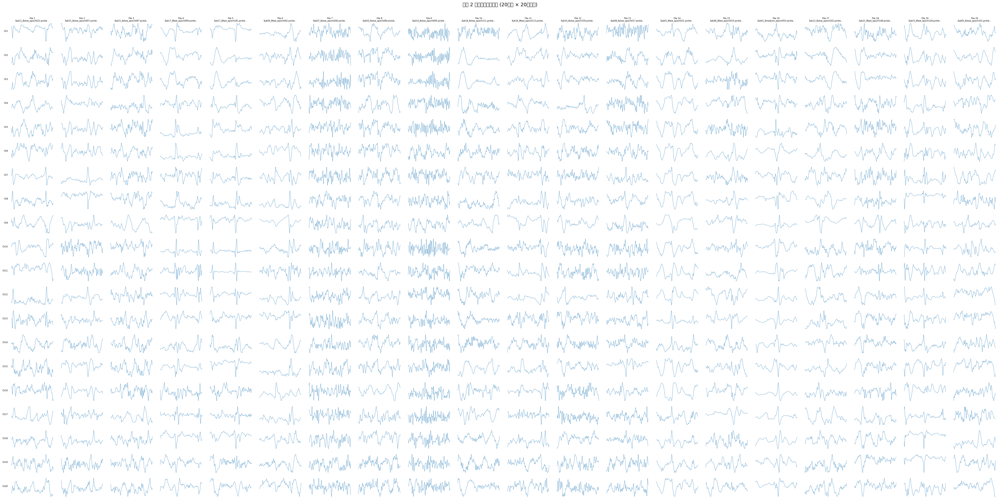


类别 2 可视化完成，显示了 20 个文件


In [5]:
# 可视化类别 2 的20个pickle文件原始数据
visualize_class_raw_data(label=2, num_files=20)


/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 31867 (\N{CJK UNIFIED IDEOGRAPH-7C7B}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 21035 (\N{CJK UNIFIED IDEOGRAPH-522B}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 30340 (\N{CJK UNIFIED IDEOGRAPH-7684}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 21407 (\N{CJK UNIFIED IDEOGRAPH-539F}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 22987 (\N{CJK UNIFIED IDEOGRAPH-59CB}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 25968 (\N{CJK UNIFIED IDEOGRAPH-6570}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4

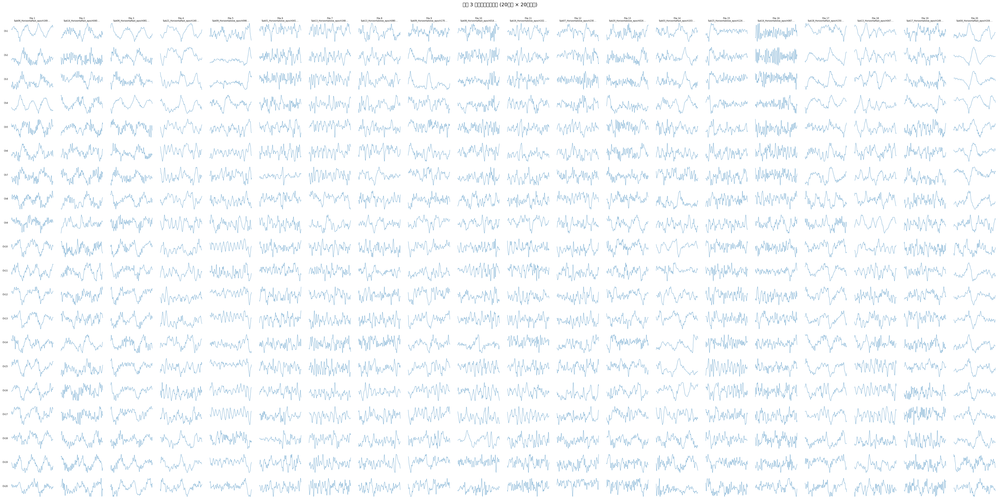


类别 3 可视化完成，显示了 20 个文件


In [6]:
# 可视化类别 3 的20个pickle文件原始数据
visualize_class_raw_data(label=3, num_files=20)


/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 31867 (\N{CJK UNIFIED IDEOGRAPH-7C7B}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 21035 (\N{CJK UNIFIED IDEOGRAPH-522B}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 30340 (\N{CJK UNIFIED IDEOGRAPH-7684}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 21407 (\N{CJK UNIFIED IDEOGRAPH-539F}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 22987 (\N{CJK UNIFIED IDEOGRAPH-59CB}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 25968 (\N{CJK UNIFIED IDEOGRAPH-6570}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4

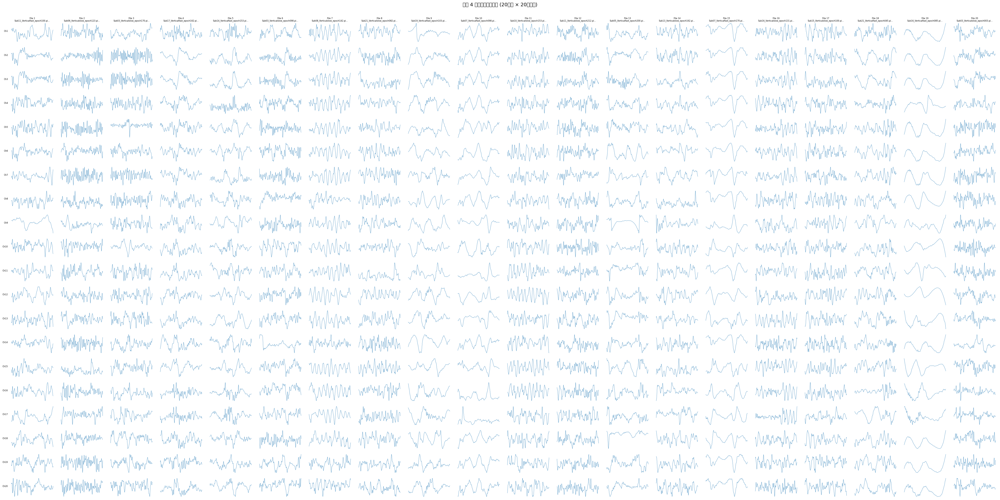


类别 4 可视化完成，显示了 20 个文件


In [7]:
# 可视化类别 4 的20个pickle文件原始数据
visualize_class_raw_data(label=4, num_files=20)


/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 31867 (\N{CJK UNIFIED IDEOGRAPH-7C7B}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 21035 (\N{CJK UNIFIED IDEOGRAPH-522B}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 30340 (\N{CJK UNIFIED IDEOGRAPH-7684}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 21407 (\N{CJK UNIFIED IDEOGRAPH-539F}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 22987 (\N{CJK UNIFIED IDEOGRAPH-59CB}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 25968 (\N{CJK UNIFIED IDEOGRAPH-6570}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4

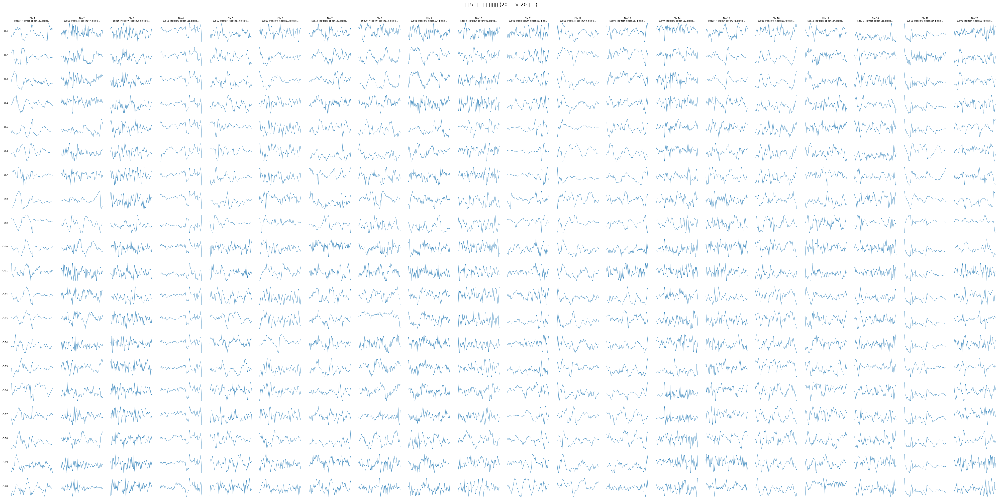


类别 5 可视化完成，显示了 20 个文件


In [8]:
# 可视化类别 5 的20个pickle文件原始数据
visualize_class_raw_data(label=5, num_files=20)


In [ ]:
# 可视化类别 6 的20个pickle文件原始数据
visualize_class_raw_data(label=6, num_files=20)


警告: 文件 Sub04_Stairfast_epoch002.pickle 的通道数不是20，而是 30


/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 31867 (\N{CJK UNIFIED IDEOGRAPH-7C7B}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 21035 (\N{CJK UNIFIED IDEOGRAPH-522B}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 30340 (\N{CJK UNIFIED IDEOGRAPH-7684}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 21407 (\N{CJK UNIFIED IDEOGRAPH-539F}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 22987 (\N{CJK UNIFIED IDEOGRAPH-59CB}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4518/3181271630.py:72: UserWarning: Glyph 25968 (\N{CJK UNIFIED IDEOGRAPH-6570}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
/tmp/ipykernel_4